In [1]:
# EDA
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import numpy as np
from tqdm import tqdm
import math

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import  CatBoostRegressor

# Learning algorithms
from sklearn.linear_model import *
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# model validation
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error as mse

import warnings
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width: 100% !important; }</style>"))

# 데이터 불러오기

In [2]:
train_df = pd.read_csv('./energy/train.csv', encoding='cp949')
test_df = pd.read_csv('./energy/test.csv', encoding='cp949')
sub_df = pd.read_csv('./energy/sample_submission.csv', encoding='cp949')

# '비전기냉방설비운영', '태양광보유' test 데이터 전처리

In [3]:
train_df.drop_duplicates(subset = ['num', '비전기냉방설비운영', '태양광보유']).dropna()

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
2040,2,2020-06-01 00,977.184,18.3,2.5,94.0,0.0,0.0,1.0,0.0
4080,3,2020-06-01 00,3183.624,17.0,2.0,100.0,1.1,0.0,1.0,1.0
6120,4,2020-06-01 00,339.552,22.6,0.7,62.0,0.0,0.0,1.0,1.0
8160,5,2020-06-01 00,3063.744,18.3,2.5,94.0,0.0,0.0,1.0,0.0
10200,6,2020-06-01 00,527.580,17.0,2.0,100.0,1.1,0.0,0.0,0.0
12240,7,2020-06-01 00,1313.658,17.6,2.5,92.0,0.8,0.0,1.0,0.0
14280,8,2020-06-01 00,4801.977,19.1,1.1,73.0,0.0,0.0,1.0,1.0
16320,9,2020-06-01 00,1255.932,20.3,1.1,74.0,0.0,0.0,0.0,1.0
18360,10,2020-06-01 00,417.960,18.3,2.5,94.0,0.0,0.0,1.0,0.0


In [4]:
sun = train_df.groupby('num')['태양광보유'].unique()
non_ele = train_df.groupby('num')['비전기냉방설비운영'].unique()

In [5]:
test_df['태양광보유'] = test_df['num'].map(sun).astype(int)
test_df['비전기냉방설비운영'] = test_df['num'].map(non_ele).astype(int)

# 컬럼명 변경

In [6]:
# renaming columns
train_df.columns = ['num','datetime','target','temperature','windspeed','humidity','precipitation','insolation','nelec_cool_flag','solar_flag']
test_df.columns = ['num','datetime','temperature','windspeed','humidity','precipitation','insolation','nelec_cool_flag','solar_flag']

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122400 entries, 0 to 122399
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   num              122400 non-null  int64  
 1   datetime         122400 non-null  object 
 2   target           122400 non-null  float64
 3   temperature      122400 non-null  float64
 4   windspeed        122400 non-null  float64
 5   humidity         122400 non-null  float64
 6   precipitation    122400 non-null  float64
 7   insolation       122400 non-null  float64
 8   nelec_cool_flag  122400 non-null  float64
 9   solar_flag       122400 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 9.3+ MB


In [8]:
test_df.head()

,num,datetime,temperature,windspeed,humidity,precipitation,insolation,nelec_cool_flag,solar_flag
0,1,2020-08-25 00,27.8,1.5,74.0,0.0,0.0,0,0
1,1,2020-08-25 01,NaN,NaN,NaN,NaN,NaN,0,0
2,1,2020-08-25 02,NaN,NaN,NaN,NaN,NaN,0,0
3,1,2020-08-25 03,27.3,1.1,78.0,NaN,0.0,0,0
4,1,2020-08-25 04,NaN,NaN,NaN,NaN,NaN,0,0


# 클러스터링

In [9]:
train_df['datetime'] = pd.to_datetime(train_df['datetime'])
train_df['weekday'] = train_df['datetime'].dt.weekday 
train_df['hour'] = train_df['datetime'].dt.hour

test_df['datetime'] = pd.to_datetime(test_df['datetime'])
test_df['weekday'] = test_df['datetime'].dt.weekday 
test_df['hour'] = test_df['datetime'].dt.hour

In [10]:
scaler = StandardScaler()

d_list = []
for i in range(1, 61):
    d = train_df[train_df['num'] == i].copy()
    d['target'] = scaler.fit_transform(d['target'].values.reshape(-1,1))
    d_ = d.groupby(['weekday', 'hour'])['target'].mean().unstack()
    d_list.append(d_.to_numpy())

# 정규화된 시간-요일별 전력사용량을 이미지처럼 저장
d_list = np.array(d_list)

In [11]:
d_list_ = d_list.reshape(60, -1)
model = KMeans(init="k-means++", n_clusters=4, random_state=0)
model.fit(d_list_)

KMeans(n_clusters=4, random_state=0)

In [12]:
cluster = model.labels_
pd.DataFrame(cluster).value_counts()

1    31
2    17
3     7
0     5
dtype: int64

In [13]:
cluster

array([0, 1, 0, 2, 0, 1, 1, 1, 0, 2, 2, 2, 1, 1, 0, 1, 1, 1, 3, 3, 3, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 3, 1, 2, 1, 2, 2, 2, 2, 2, 1, 1,
       1, 1, 1, 1, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 2, 2])

In [14]:
cluster_map = {i+1 : c for i, c in enumerate(cluster)}
train_df['cluster'] = train_df['num'].map(cluster_map)
test_df['cluster'] = test_df['num'].map(cluster_map)

In [15]:
# dictionary mapping cluster and building
match = train_df[['num','cluster']]
clust_to_num = {0:[],1:[],2:[],3:[]}
for i in range(60):
    c = cluster[i]
    clust_to_num[c].append(i+1)

In [16]:
clust_to_num

{0: [1, 3, 5, 9, 15],
 1: [2,
  6,
  7,
  8,
  13,
  14,
  16,
  17,
  18,
  22,
  23,
  24,
  25,
  26,
  27,
  33,
  35,
  37,
  43,
  44,
  45,
  46,
  47,
  48,
  52,
  53,
  54,
  55,
  56,
  57,
  58],
 2: [4, 10, 11, 12, 28, 29, 30, 31, 32, 36, 38, 39, 40, 41, 42, 59, 60],
 3: [19, 20, 21, 34, 49, 50, 51]}

# feature engineering

In [17]:
def get_pow(series):
    return math.pow(series, 0.15)

In [18]:
def train_preprocess(train):
    X_train = train.copy()
    
    # 날짜 관련 변수 전처리 및 변수 생성
    X_train['month'] = X_train['datetime'].dt.month
    X_train['day'] = X_train['datetime'].dt.day
    X_train['date'] = X_train['datetime'].dt.date
    X_train['dayofyear'] = X_train['datetime'].dt.dayofyear
    X_train['weekend'] = X_train['weekday'].apply(lambda x: 0 if x < 5 else 1)
    
#     X_train.loc[X_train.weekday >= 5, 'holiday'] = 1
#     X_train.loc[X_train.weekday < 5, 'holiday'] = 0
    X_train.loc[(X_train.month == 8) & (X_train.day == 17), 'weekend'] = 1
    
    X_train['date_num'] = X_train['month'] + X_train['day']/31
    X_train['date_num2'] = X_train['month'] + X_train['day']/7
    X_train['date_num3'] = X_train['month'] + X_train['dayofyear']
    X_train['date_num4'] = X_train['month'] + X_train['hour']/24
    X_train['date_num5'] = X_train['weekday'] + X_train['hour']/24
    X_train['date_num6'] = X_train['dayofyear'] + X_train['hour']/24
    X_train['date_num7'] = X_train['weekend'] + X_train['hour']/24
    X_train['date_num8'] = X_train['month'] + X_train['weekday'] + X_train['hour']/24
    
    # 체감온도와 불쾌지수 추가
    X_train['perceived_temperature'] = 13.12 + 0.6215*X_train['temperature'] - 11.37*X_train['windspeed'].apply(get_pow) + 0.3965*X_train['windspeed'].apply(get_pow)*X_train['temperature']
    X_train['discomfort_index'] = 1.8*X_train['temperature'] - 0.55*(1-X_train['humidity'])*(1.8*X_train['temperature']-26) + 32
    
    X_train['id'] = X_train['num'].astype(str)
    
    # 코로나 거리두기 단계 추가
    corona=[]
    for m,d in zip(X_train['month'], X_train['day']):
        if m==8 and d>=16:
            corona.append(2)
        else:
            corona.append(1)
    X_train['corona'] = corona
    
    # 건물별 날짜별 통계값 변수 추가
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].min().reset_index().rename(columns = {'temperature':'min_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].max().reset_index().rename(columns = {'temperature':'max_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].mean().reset_index().rename(columns = {'temperature':'mean_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['humidity'].mean().reset_index().rename(columns = {'humidity':'mean_humidity'}), on = ['num','date'], how = 'left')
            
    # 클러스터 그룹 및 건물별 특징 변수 추가
    X_trains = [X_train[X_train.num == num] for num in range(1,61,1)]
#     for num in clust_to_num[1]:
# #         if num in [43, 44, 58]:
# #             temp_df = X_trains[num-1]
# #             temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
# #             X_trains[num-1] = temp_df
# #         if num == 45:
# #             temp_df = X_trains[num-1]
# #             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12,13,14,15,16,17]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
# #             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12]))&(temp_df['weekday'].isin([5]))).astype(int)
# #             #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
# #             X_trains[num-1] = temp_df
#         if num in [7, 18, 27, 43, 44, 54, 55, 57, 58, 45]:
#             pass
#         else:
#             temp_df = X_trains[num-1]
#             temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             X_trains[num-1] = temp_df
    for num in clust_to_num[2]:
        if num in [28, 30, 32, 39, 42, 59, 60]:
            pass
        else:
            temp_df = X_trains[num-1]
            temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
            X_trains[num-1] = temp_df
#     for num in clust_to_num[3]:
#         temp_df = X_trains[num-1]
#         temp_df['working_time'] = ((temp_df['hour'].isin([18,19,20,21,22]))).astype(int)
#         X_trains[num-1] = temp_df

    y_trains = [df['target'].values for df in X_trains]
    X_trains = [df.drop('target', axis = 1) for df in X_trains]

    # drop unnecessary columns
    X_trains = [df.drop(['datetime', 'date', 'day', 'num'], axis=1).reset_index().drop('index', axis=1) for df in X_trains]
    # standard scaling on numerical features
    num_features = ['temperature', 'windspeed', 'humidity', 'precipitation', 'insolation', 'perceived_temperature', 'discomfort_index', 'min_temperature', 'max_temperature', 
                    'mean_temperature', 'mean_humidity']

    means = []
    stds = []
    for i, df in enumerate(X_trains):
        means.append(df.loc[:,num_features].mean(axis=0))
        stds.append(df.loc[:,num_features].std(axis=0))
        df.loc[:,num_features] = (df.loc[:,num_features] - df.loc[:,num_features].mean(axis=0))/df.loc[:,num_features].std(axis=0)
        X_trains[i] = df
        
    return X_trains, y_trains, means, stds

In [19]:
def test_preprocess(test, means, stds):

    X_train = test.copy()
    # 결측치 선형보간
    X_train = X_train.interpolate(method='values').round(1)
    
    # 날짜 관련 변수 전처리 및 변수 생성
    X_train['month'] = X_train['datetime'].dt.month
    X_train['day'] = X_train['datetime'].dt.day
    X_train['date'] = X_train['datetime'].dt.date
    X_train['dayofyear'] = X_train['datetime'].dt.dayofyear
    X_train['weekend'] = X_train['weekday'].apply(lambda x: 0 if x < 5 else 1)
    
#     X_train.loc[X_train.weekday >= 5, 'holiday'] = 1
#     X_train.loc[X_train.weekday < 5, 'holiday'] = 0
    X_train.loc[(X_train.month == 8) & (X_train.day == 17), 'weekend'] = 1
    
    X_train['date_num'] = X_train['month'] + X_train['day']/31
    X_train['date_num2'] = X_train['month'] + X_train['day']/7
    X_train['date_num3'] = X_train['month'] + X_train['dayofyear']
    X_train['date_num4'] = X_train['month'] + X_train['hour']/24
    X_train['date_num5'] = X_train['weekday'] + X_train['hour']/24
    X_train['date_num6'] = X_train['dayofyear'] + X_train['hour']/24
    X_train['date_num7'] = X_train['weekend'] + X_train['hour']/24
    X_train['date_num8'] = X_train['month'] + X_train['weekday'] + X_train['hour']/24
    
    X_train['perceived_temperature'] = 13.12 + 0.6215*X_train['temperature'] - 11.37*X_train['windspeed'].apply(get_pow) + 0.3965*X_train['windspeed'].apply(get_pow)*X_train['temperature']
    X_train['discomfort_index'] = 1.8*X_train['temperature'] - 0.55*(1-X_train['humidity'])*(1.8*X_train['temperature']-26) + 32
    
    X_train['id'] = X_train['num'].astype(str)
    
    
    # 체감온도와 불쾌지수 추가
    corona2=[]
    for i in range(len(X_train)):
        corona2.append(2)
    X_train['corona'] = corona2
    
    # 건물별 날짜별 통계값 변수 추가
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].min().reset_index().rename(columns = {'temperature':'min_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].max().reset_index().rename(columns = {'temperature':'max_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['temperature'].mean().reset_index().rename(columns = {'temperature':'mean_temperature'}), on = ['num','date'], how = 'left')
    X_train = X_train.merge(X_train.groupby(['num','date'])['humidity'].mean().reset_index().rename(columns = {'humidity':'mean_humidity'}), on = ['num','date'], how = 'left')

            
    # 클러스터 그룹 및 건물별 특징 변수 추가
    X_trains = [X_train[X_train.num == num] for num in range(1,61,1)]
#     for num in clust_to_num[1]:
# #         if num in [43, 44, 58]:
# #             temp_df = X_trains[num-1]
# #             temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
# #             X_trains[num-1] = temp_df
# #         if num == 45:
# #             temp_df = X_trains[num-1]
# #             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12,13,14,15,16,17]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
# #             temp_df['working_time'] = ((temp_df['hour'].isin([7,8,9,10,11,12]))&(temp_df['weekday'].isin([5]))).astype(int)
# #             #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
# #             X_trains[num-1] = temp_df
#         if num in [7, 18, 27, 43, 44, 54, 55, 57, 58, 45]:
#             pass
#         else:
#             temp_df = X_trains[num-1]
#             temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             #temp_df['lunch_time'] = ((temp_df['hour'].isin([11,12]))&(temp_df['weekday'].isin([0,1,2,3,4]))).astype(int)
#             X_trains[num-1] = temp_df
    for num in clust_to_num[2]:
        if num in [28, 30, 32, 39, 42, 59, 60]:
            pass
        else:
            temp_df = X_trains[num-1]
            temp_df['working_time'] = ((temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18,19]))).astype(int)
            X_trains[num-1] = temp_df
#     for num in clust_to_num[3]:
#         temp_df = X_trains[num-1]
#         temp_df['working_time'] = ((temp_df['hour'].isin([18,19,20,21,22]))).astype(int)
#         X_trains[num-1] = temp_df

    # drop unnecessary columns
    X_trains = [df.drop(['datetime', 'date', 'day', 'num'], axis=1).reset_index().drop('index', axis=1) for df in X_trains]
    # standard scaling on numerical features
    num_features = ['temperature', 'windspeed', 'humidity', 'precipitation', 'insolation', 'perceived_temperature', 'discomfort_index', 'min_temperature', 'max_temperature', 
                    'mean_temperature', 'mean_humidity']
    
    for i, (df, mean, std) in enumerate(zip(X_trains, means, stds)):
        df.loc[:,num_features] = (df.loc[:,num_features] - mean) / std
        X_trains[i] = df
        
    return X_trains

In [20]:
X_trains, y_trains, means, stds = train_preprocess(train_df)
X_tests = test_preprocess(test_df, means, stds)

In [21]:
# object형 변수는 cat_features에 추가
cat_features = [f for f in X_trains[0].columns if X_trains[0][f].dtype == 'object']

def column_index(df, cat_features):
    cols = df.columns.values
    sidx = np.argsort(cols)
    return sidx[np.searchsorted(cols, cat_features, sorter=sidx)]

cat_features_idx = column_index(X_trains[0], cat_features)    
print("Cat features are: %s" % [f for f in cat_features])
print(cat_features_idx)

Cat features are: ['id']
[24]


In [22]:
y_trains[0]

array([8179.056, 8135.64 , 8107.128, ..., 8730.504, 8725.968, 8705.232])

In [23]:
X_trains[0]

,num,temperature,windspeed,humidity,precipitation,insolation,nelec_cool_flag,solar_flag,weekday,hour,...,date_num7,date_num8,perceived_temperature,discomfort_index,id,corona,min_temperature,max_temperature,mean_temperature,mean_humidity
0,1,-2.144783,0.138604,1.021261,0.132565,-0.537398,0.0,0.0,0,0,...,0.000000,6.000000,-2.187964,-2.098118,1_0_153,1,-2.096415,-1.471290,-2.271350,-0.923134
1,1,-2.114181,0.498568,0.957546,-0.083954,-0.537398,0.0,0.0,0,1,...,0.041667,6.041667,-2.189334,-2.070659,1_1_153,1,-2.096415,-1.471290,-2.271350,-0.923134
2,1,-2.175385,0.768541,0.957546,-0.213865,-0.537398,0.0,0.0,0,2,...,0.083333,6.083333,-2.273994,-2.154335,1_2_153,1,-2.096415,-1.471290,-2.271350,-0.923134
3,1,-2.297795,0.768541,0.957546,-0.213865,-0.537398,0.0,0.0,0,3,...,0.125000,6.125000,-2.399672,-2.321689,1_3_153,1,-2.096415,-1.471290,-2.271350,-0.923134
4,1,-2.328397,0.858532,1.021261,-0.213865,-0.537398,0.0,0.0,0,4,...,0.166667,6.166667,-2.438418,-2.351882,1_4_153,1,-2.096415,-1.471290,-2.271350,-0.923134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2035,1,1.466283,0.948523,-0.635345,-0.213865,0.044807,0.0,0.0,0,19,...,0.791667,8.791667,1.465823,1.120746,1_19_237,2,0.887716,1.142556,1.391609,-0.329910
2036,1,1.252067,-0.401342,-0.444198,-0.213865,-0.537398,0.0,0.0,0,20,...,0.833333,8.833333,1.244743,1.102492,1_20_237,2,0.887716,1.142556,1.391609,-0.329910
2037,1,1.129658,-1.121270,-0.316767,-0.213865,-0.537398,0.0,0.0,0,21,...,0.875000,8.875000,1.126857,1.101507,1_21_237,2,0.887716,1.142556,1.391609,-0.329910
2038,1,1.129658,0.048613,-0.253051,-0.213865,-0.537398,0.0,0.0,0,22,...,0.916667,8.916667,1.121464,1.164642,1_22_237,2,0.887716,1.142556,1.391609,-0.329910


In [24]:
X_trains[0].isna().sum()

num                      0
temperature              0
windspeed                0
humidity                 0
precipitation            0
insolation               0
nelec_cool_flag          0
solar_flag               0
weekday                  0
hour                     0
cluster                  0
month                    0
dayofyear                0
weekend                  0
date_num                 0
date_num2                0
date_num3                0
date_num4                0
date_num5                0
date_num6                0
date_num7                0
date_num8                0
perceived_temperature    0
discomfort_index         0
id                       0
corona                   0
min_temperature          0
max_temperature          0
mean_temperature         0
mean_humidity            0
dtype: int64

In [25]:
X_tests[0]

,num,temperature,windspeed,humidity,precipitation,insolation,nelec_cool_flag,solar_flag,weekday,hour,...,date_num7,date_num8,perceived_temperature,discomfort_index,id,corona,min_temperature,max_temperature,mean_temperature,mean_humidity
0,1,0.976647,-0.761306,-0.125620,-0.213865,-0.537398,0,0,1,0,...,0.000000,9.000000,0.974977,1.120452,1_0_238,2,1.910847,2.210183,2.467666,-0.569344
1,1,0.915443,-0.851297,-0.042789,-0.213865,-0.537398,0,0,1,1,...,0.041667,9.041667,0.916393,1.130197,1_1_238,2,1.910847,2.210183,2.467666,-0.569344
2,1,0.884840,-1.031279,0.046412,-0.213865,-0.537398,0,0,1,2,...,0.083333,9.083333,0.889776,1.178798,1_2_238,2,1.910847,2.210183,2.467666,-0.569344
3,1,0.823636,-1.121270,0.129243,-0.213865,-0.537398,0,0,1,3,...,0.125000,9.125000,0.832737,1.184305,1_3_238,2,1.910847,2.210183,2.467666,-0.569344
4,1,0.701227,-1.031279,0.237559,-0.213865,-0.537398,0,0,1,4,...,0.166667,9.166667,0.712393,1.137131,1_4_238,2,1.910847,2.210183,2.467666,-0.569344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,1,1.099056,0.408577,-0.208450,-0.213865,1.791421,0,0,0,19,...,0.791667,8.791667,1.089172,1.175337,1_19_244,2,0.972977,0.295817,0.809903,0.277609
164,1,0.946045,0.228595,-0.170221,-0.213865,0.627012,0,0,0,20,...,0.833333,8.833333,0.934853,1.044079,1_20_244,2,0.972977,0.295817,0.809903,0.277609
165,1,0.762431,0.048613,-0.125620,-0.213865,-0.537398,0,0,0,21,...,0.875000,8.875000,0.751305,0.881808,1_21_244,2,0.972977,0.295817,0.809903,0.277609
166,1,0.731829,-0.401342,0.148357,-0.213865,-0.537398,0,0,0,22,...,0.916667,8.916667,0.727955,1.093724,1_22_244,2,0.972977,0.295817,0.809903,0.277609


In [26]:
X_tests[0].isna().sum()

num                      0
temperature              0
windspeed                0
humidity                 0
precipitation            0
insolation               0
nelec_cool_flag          0
solar_flag               0
weekday                  0
hour                     0
cluster                  0
month                    0
dayofyear                0
weekend                  0
date_num                 0
date_num2                0
date_num3                0
date_num4                0
date_num5                0
date_num6                0
date_num7                0
date_num8                0
perceived_temperature    0
discomfort_index         0
id                       0
corona                   0
min_temperature          0
max_temperature          0
mean_temperature         0
mean_humidity            0
dtype: int64

# 모델 정의 및 학습

In [27]:
# metric
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred)))*100

# customized k-fold CV class for scikit-learn model
class CV_sklearn():
    def __init__(self, models, n_folds = 10):
        '''
        models : list of 8 models
        n_folds : int
        '''
        self.models = models
        self.n_folds = n_folds
    
    def cv_score(self, X_trains, y_trains, X_tests, verbose = 0, perm_imp = False, feat_imp = False):
        '''
        X_trains : list of 60 dataframes
        y_trains : list of 60 series
        '''
        trues = [[],[],[],[],[],[],[],[],[],[]]
        preds = [[],[],[],[],[],[],[],[],[],[]]
        permutation_importances = [[],[],[],[],[],[],[],[]]
        feature_importances = [[],[],[],[],[],[],[],[]]
        
#         sub = [[],[],[],[],[],[],[],[],[],[]]
        sub = []
        
        # for each building
        for i, (X_train, y_train, X_test) in enumerate(zip(X_trains, y_trains, X_tests)):
            
            kfold = KFold(n_splits=self.n_folds, shuffle = True,random_state=55)
            print(f"\n\n**************************************{i+1}************************************************")
            
            # for each fold
            each_sub = np.zeros((X_test.shape[0]))
            outcomes=[]
            print(X_test.shape, X_train.shape, kfold.n_splits)
            for j, (tr_idx, val_idx) in enumerate(kfold.split(X_train, y_train)):
                print(f'===================================={i+1}_{j+1}============================================')
                X_tr, X_val = X_train.iloc[tr_idx,:], X_train.iloc[val_idx,:]
                y_tr, y_val = y_train[tr_idx], y_train[val_idx]
                
                # fit model on each fold
                temp_model = self.models[j][i]
                temp_model.fit(X_tr, y_tr, eval_set=[(X_tr, y_tr),(X_val, y_val)], early_stopping_rounds= 50, verbose=False, cat_features=cat_features)
#                 if perm_imp:
#                     r = permutation_importance(temp_model, X_val, y_val, n_repeats=10, scoring=smape, random_state=2)
#                     permutation_importances[j].append(r['importances_mean'])
#                 if feat_imp:
#                     feature_importances[j].append(temp_model.feature_importances_)
                self.models[j][i] = temp_model
                pred = temp_model.predict(X_val)
                test_pred = temp_model.predict(X_test)
                true = y_val
                preds[j].append(pred)
                trues[j].append(true)
#                 sub[j].append(test_pred)
                each_sub+=test_pred
                val_mse = mse(true, pred)
                outcomes.append(val_mse)
                print(f'================================================================================\n\n')
            
            sub.append(each_sub/kfold.n_splits)
            mean_outcome=np.mean(outcomes)
            print("NUM:{}_Mean:{}".format(i+1, mean_outcome))
            
            if (verbose == 1)&((i+1)%5==0) :
                print(f'{i+1}th model complete')

        scores = []
        for true, pred in zip(trues, preds):
            true_f = np.concatenate(true)
            pred_f = np.concatenate(pred)
            scores.append(SMAPE(true_f, pred_f))

        self.trues = trues
        self.preds = preds
#         self.permutation_importances = permutation_importances
#         self.feature_importanc

        return scores, sub

In [28]:
# lr_models = [[XGBRegressor(n_estimators = 10000, learning_rate=0.01, max_depth=10, random_seed=777) for i in range(60)] for j in range(10)]
# cv_lr = CV_sklearn(lr_models, n_folds = 10)
# scores_lr, sub = cv_lr.cv_score(X_trains, y_trains, X_tests, verbose = 1)
# print(np.mean(scores_lr))

In [29]:
lr_models = [[CatBoostRegressor(n_estimators = 30000, learning_rate=0.04, max_depth=8, random_seed=123) for i in range(60)] for j in range(10)]
cv_lr = CV_sklearn(lr_models, n_folds = 10)
scores_lr, sub = cv_lr.cv_score(X_trains, y_trains, X_tests, verbose = 1)
print(np.mean(scores_lr))



**************************************1************************************************
(168, 30) (2040, 30) 10
====================================1_1============================================


====================================1_2============================================


====================================1_3============================================


====================================1_4============================================


====================================1_5============================================


====================================1_6============================================


====================================1_7============================================


====================================1_8============================================


====================================1_9============================================


====================================1_10============================================


NUM:1_Mean:14.66390537932



====================================5_7============================================


====================================5_8============================================


====================================5_9============================================


====================================5_10============================================


NUM:5_Mean:74.94810929516751
5th model complete


**************************************6************************************************
(168, 30) (2040, 30) 10
====================================6_1============================================


====================================6_2============================================


====================================6_3============================================


====================================6_4============================================


====================================6_5============================================


====================================6_6======================



====================================10_2============================================


====================================10_3============================================


====================================10_4============================================


====================================10_5============================================


====================================10_6============================================


====================================10_7============================================


====================================10_8============================================


====================================10_9============================================


====================================10_10============================================


NUM:10_Mean:41.56951044973927
10th model complete


**************************************11************************************************
(168, 31) (2040, 31) 10
====================================11_1=========



====================================14_8============================================


====================================14_9============================================


====================================14_10============================================


NUM:14_Mean:43.07194587269445


**************************************15************************************************
(168, 30) (2040, 30) 10
====================================15_1============================================


====================================15_2============================================


====================================15_3============================================


====================================15_4============================================


====================================15_5============================================


====================================15_6============================================


====================================15_7=============================



====================================19_3============================================


====================================19_4============================================


====================================19_5============================================


====================================19_6============================================


====================================19_7============================================


====================================19_8============================================


====================================19_9============================================


====================================19_10============================================


NUM:19_Mean:14.085266738144133


**************************************20************************************************
(168, 30) (2040, 30) 10
====================================20_1============================================


====================================20_2============================



====================================23_9============================================


====================================23_10============================================


NUM:23_Mean:43.09621010846488


**************************************24************************************************
(168, 30) (2040, 30) 10
====================================24_1============================================


====================================24_2============================================


====================================24_3============================================


====================================24_4============================================


====================================24_5============================================


====================================24_6============================================


====================================24_7============================================


====================================24_8=============================



====================================28_4============================================


====================================28_5============================================


====================================28_6============================================


====================================28_7============================================


====================================28_8============================================


====================================28_9============================================


====================================28_10============================================


NUM:28_Mean:52.80083175062968


**************************************29************************************************
(168, 31) (2040, 31) 10
====================================29_1============================================


====================================29_2============================================


====================================29_3=============================



====================================32_10============================================


NUM:32_Mean:6.285580379985116


**************************************33************************************************
(168, 30) (2040, 30) 10
====================================33_1============================================


====================================33_2============================================


====================================33_3============================================


====================================33_4============================================


====================================33_5============================================


====================================33_6============================================


====================================33_7============================================


====================================33_8============================================


====================================33_9=============================



====================================37_5============================================


====================================37_6============================================


====================================37_7============================================


====================================37_8============================================


====================================37_9============================================


====================================37_10============================================


NUM:37_Mean:39.73478607309429


**************************************38************************************************
(168, 31) (2040, 31) 10
====================================38_1============================================


====================================38_2============================================


====================================38_3============================================


====================================38_4=============================



NUM:41_Mean:28.067052525172983


**************************************42************************************************
(168, 30) (2040, 30) 10
====================================42_1============================================


====================================42_2============================================


====================================42_3============================================


====================================42_4============================================


====================================42_5============================================


====================================42_6============================================


====================================42_7============================================


====================================42_8============================================


====================================42_9============================================


====================================42_10============================



====================================46_6============================================


====================================46_7============================================


====================================46_8============================================


====================================46_9============================================


====================================46_10============================================


NUM:46_Mean:47.08184762486147


**************************************47************************************************
(168, 30) (2040, 30) 10
====================================47_1============================================


====================================47_2============================================


====================================47_3============================================


====================================47_4============================================


====================================47_5=============================



====================================51_2============================================


====================================51_3============================================


====================================51_4============================================


====================================51_5============================================


====================================51_6============================================


====================================51_7============================================


====================================51_8============================================


====================================51_9============================================


====================================51_10============================================


NUM:51_Mean:19.388187205226533


**************************************52************************************************
(168, 30) (2040, 30) 10
====================================52_1============================



====================================55_8============================================


====================================55_9============================================


====================================55_10============================================


NUM:55_Mean:36.49858069450106
55th model complete


**************************************56************************************************
(168, 30) (2040, 30) 10
====================================56_1============================================


====================================56_2============================================


====================================56_3============================================


====================================56_4============================================


====================================56_5============================================


====================================56_6============================================


====================================56_7=========



====================================60_3============================================


====================================60_4============================================


====================================60_5============================================


====================================60_6============================================


====================================60_7============================================


====================================60_8============================================


====================================60_9============================================


====================================60_10============================================


NUM:60_Mean:71.96657042550082
60th model complete
1.3243602370425755


In [30]:
# extract cross validation prediction
cv_trues = [np.concatenate([f1, f2, f3, f4, f5, f6, f7, f8, f9, f10]) for f1, f2, f3, f4, f5, f6, f7, f8, f9, f10 in zip(*cv_lr.trues)]
cv_preds = [np.concatenate([f1, f2, f3, f4, f5, f6, f7, f8, f9, f10]) for f1, f2, f3, f4, f5, f6, f7 , f8, f9, f10 in zip(*cv_lr.preds)]

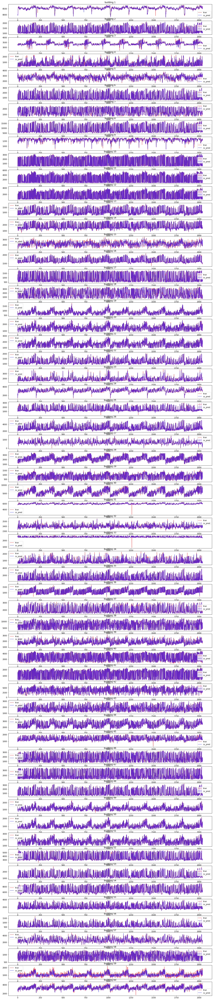

In [31]:
fig = plt.figure(figsize = (20, 100))
for i, (pred, true) in enumerate(zip(cv_preds, cv_trues)):
    plt.subplot(60,1,i+1)
    plt.plot(true, c = 'red', alpha = 0.6, label = 'true')
    plt.plot(pred, c = 'blue', alpha = 0.6, label = 'cv_pred')
    plt.legend()
    plt.title(f'building {i+1}')

In [32]:
sub = np.array(sub)
sub = sub.reshape(-1)
sub.shape

(10080,)

In [33]:
sub_df['answer'] = sub

In [34]:
sub = sub.reshape(60, -1)
sub.shape

(60, 168)

In [35]:
y_trains
y_train = np.array(y_trains).reshape(60, -1)
y_train.shape

(60, 2040)

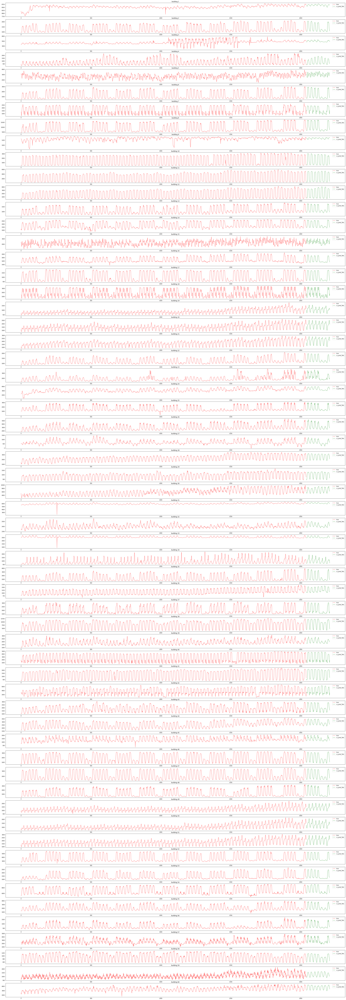

In [36]:
fig = plt.figure(figsize = (50, 150))
for i, (pred, true, test_pred) in enumerate(zip(cv_preds, y_train, sub)):
    plt.subplot(60,1,i+1)
    plt.plot(true, c = 'red', alpha = 0.6, label = 'true')
#     plt.plot(pred, c = 'blue', alpha = 0.6, label = 'cv_pred')
    plt.plot(np.arange(len(pred), len(pred)+168), test_pred, c = 'green', alpha = 0.6, label = 'cv_pred_Test')
    plt.legend()
    plt.title(f'building {i+1}')

In [38]:
sub_df.to_csv('./submission_kfold_cat_fold10_0623_1.3243602370425755.csv', index=False)